In [9]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%load_ext line_profiler
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import corner

import pickle
import glob
import json
import h5py

import scipy.constants as sc
from scipy.stats import norm

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [2]:
#with open('fast_like_test_psrs_A2e-15_M5e9_f2e-8_evolve_no_gwb_no_rn_no_ecorr_no_equad.pkl', 'rb') as psr_pkl:
with open('data/fast_like_test_psrs_A1e-15_M5e9_f2e-8_evolve_no_gwb_no_rn_no_ecorr_no_equad.pkl', 'rb') as psr_pkl:
    psrs = pickle.load(psr_pkl)
    
print(len(psrs))

45


In [3]:
hdf_file = "results/quickCW_test_A1e-15_M5e9_f2e-8_evolve_no_gwb_no_rn_no_ecorr_no_equad_v1.h5"

with h5py.File(hdf_file, 'r') as f:
    print(list(f.keys()))
    samples_cold = f['samples_cold'][::10,:]
    #samples_cold = f['samples_cold'][...]
    log_likelihood = f['log_likelihood'][:,::10]
    #log_likelihood = f['log_likelihood'][...]
    par_names = [x.decode('UTF-8') for x in list(f['par_names'])]
    acc_fraction = f['acc_fraction'][...]

print('Acceptance fraction #columns: chain number; rows: proposal type (PT, extrinsic, intrinsic):')
print(acc_fraction)
print(samples_cold.shape)
#print(par_names)

['acc_fraction', 'log_likelihood', 'par_names', 'samples_cold']
Acceptance fraction #columns: chain number; rows: proposal type (PT, extrinsic, intrinsic):
[[0.7127     0.87255    0.935      0.9589     0.96855    0.974
  0.9763            nan]
 [0.6359904  0.80297677 0.87411364 0.90326768 0.91446869 0.91964394
  0.92299596 0.92526212]]
(20000, 98)


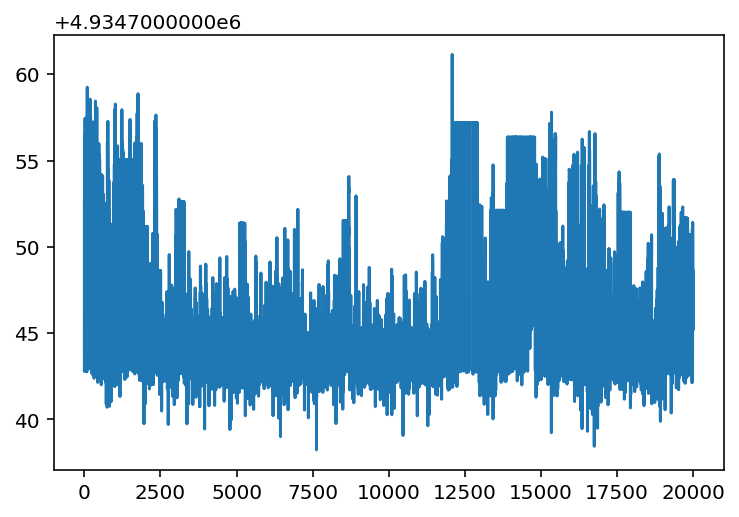

In [5]:
for j in range(1):
    plt.plot(log_likelihood[j,::1])

#plt.ylim(4_939_550, 4_939_650)
#plt.ylim(4_939_400, 4_939_500)
#plt.ylim(4_934_400, 4_934_820)
#plt.ylim(4_940_385, 4_940_425)
#plt.xlim(990, 1010)

{'0_cos_gwtheta': 0.5000000000000001, '0_cos_inc': 0.5403023058681398, '0_gwphi': 4.5, '0_log10_fgw': -7.698970004336019, '0_log10_h': -15.0, '0_log10_mc': 9.698970004336019, '0_phase0': 1.0, '0_psi': 1.0, 'B1855+09_red_noise_gamma': 4.223680673175877, 'B1855+09_red_noise_log10_A': -14.029792598548077, 'B1855+09_cw0_p_dist': 0.0, 'B1855+09_cw0_p_phase': 2.6438308998949296, 'B1937+21_red_noise_gamma': 3.3871118142793657, 'B1937+21_red_noise_log10_A': -13.462268788784227, 'B1937+21_cw0_p_dist': 0.0, 'B1937+21_cw0_p_phase': 3.2279381298720224, 'B1953+29_red_noise_gamma': 2.631402213059383, 'B1953+29_red_noise_log10_A': -13.010321805607543, 'B1953+29_cw0_p_dist': 0.0, 'B1953+29_cw0_p_phase': 2.9511881131039246, 'J0023+0923_red_noise_gamma': 0.491178551670215, 'J0023+0923_red_noise_log10_A': -13.231529320012353, 'J0023+0923_cw0_p_dist': 0.0, 'J0023+0923_cw0_p_phase': 5.358659229734059, 'J0030+0451_red_noise_gamma': 5.332138721578978, 'J0030+0451_red_noise_log10_A': -14.690749981456484, 'J00

/tmp/ipykernel_53382/1727418389.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


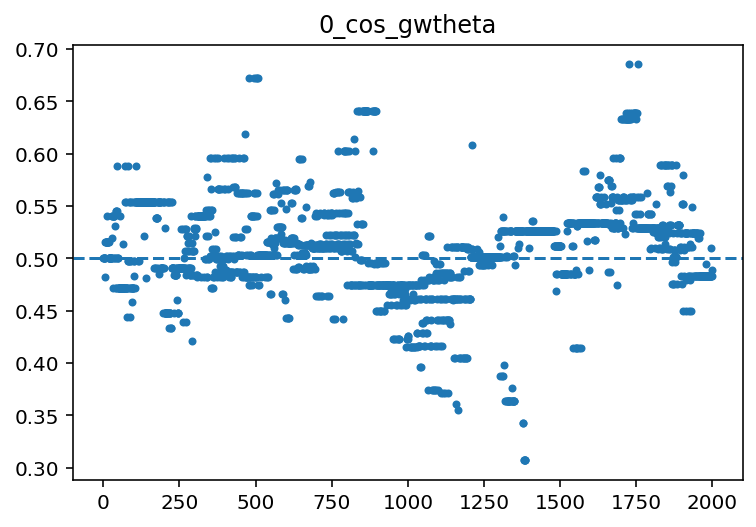

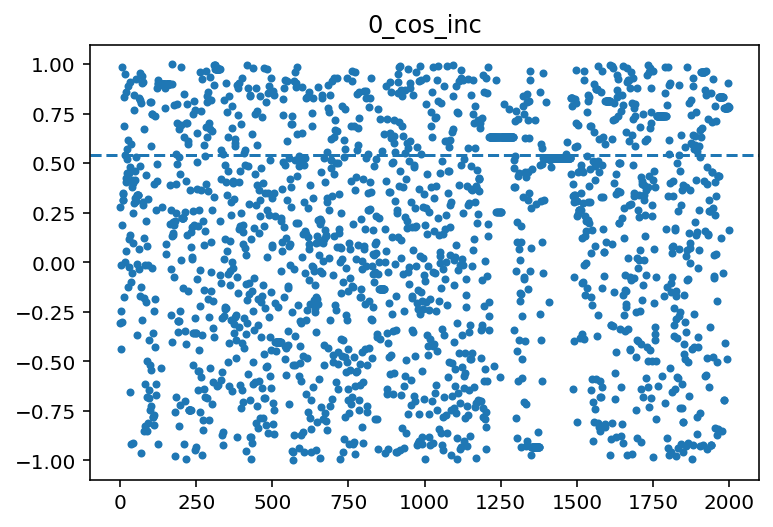

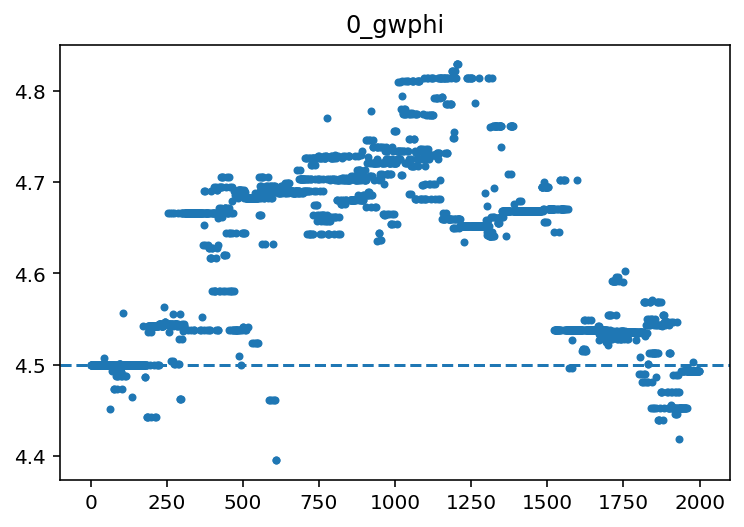

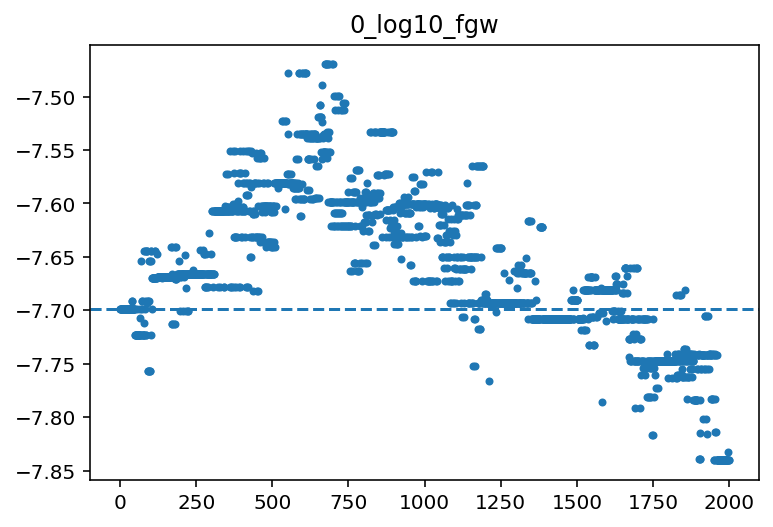

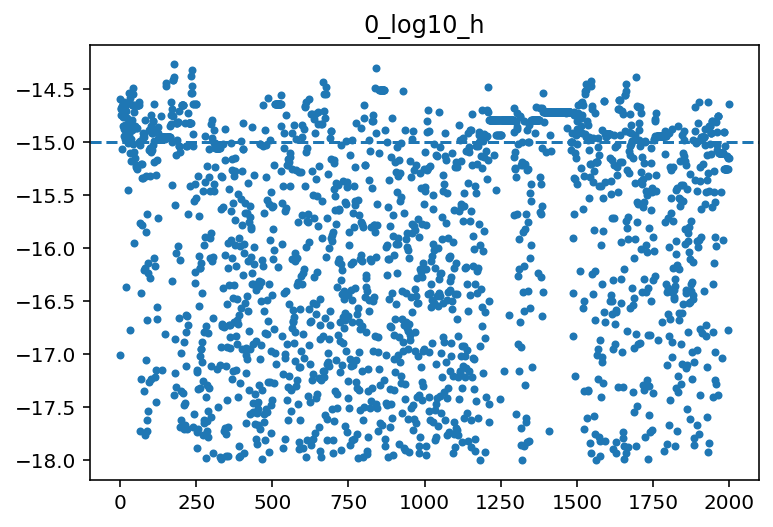

...

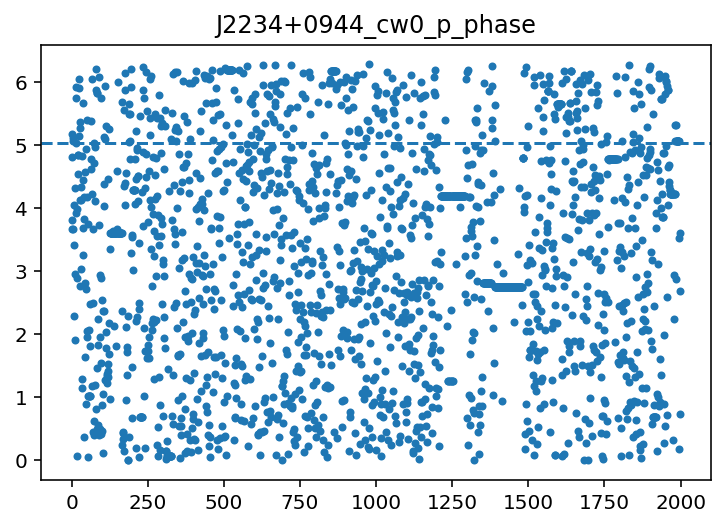

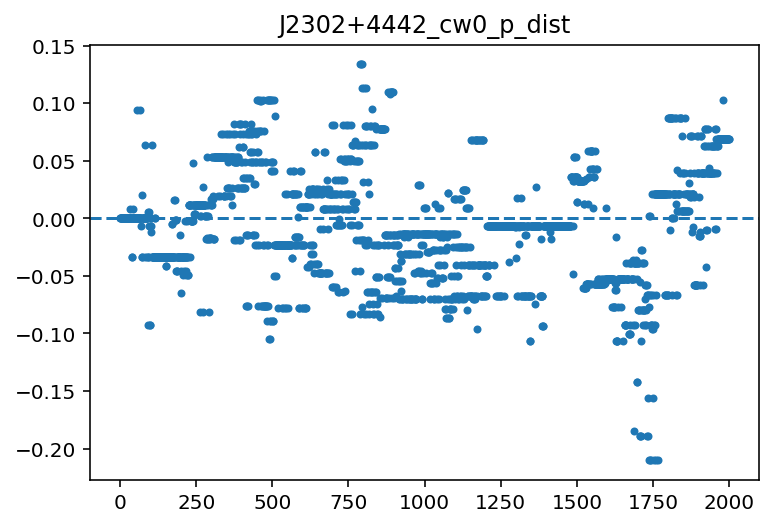

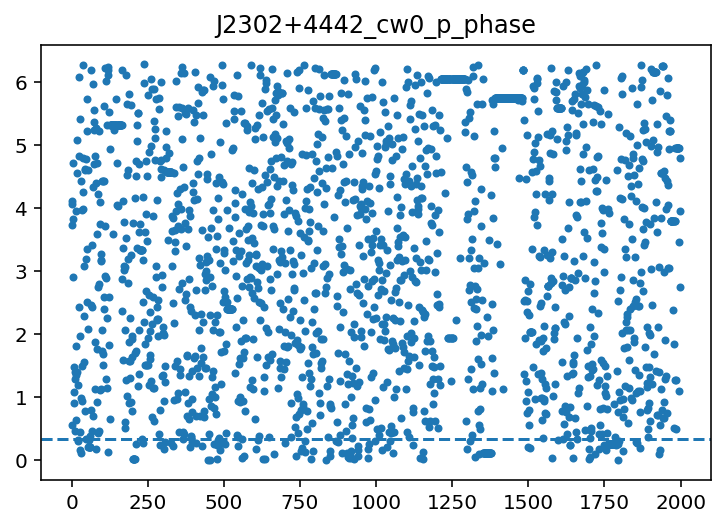

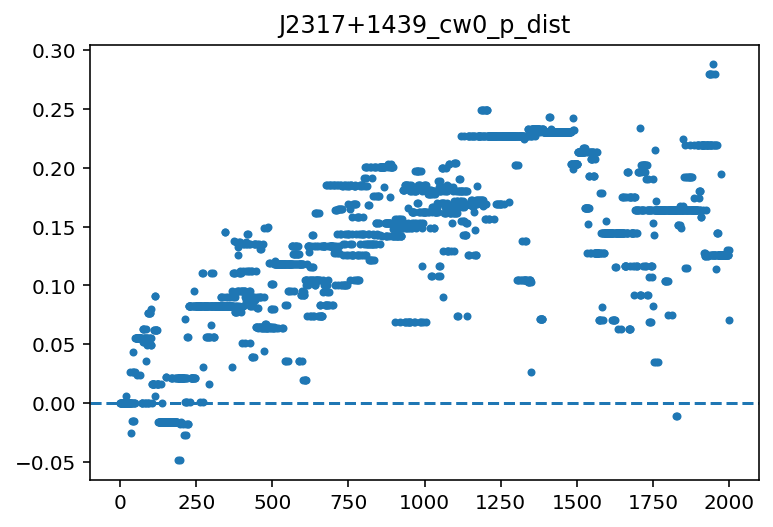

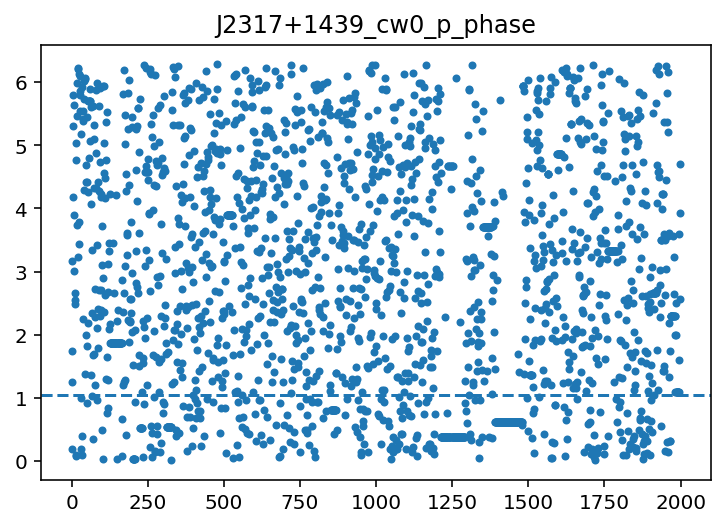

In [8]:
KPC2S = sc.parsec / sc.c * 1e3
SOLAR2S = sc.G / sc.c ** 3 * 1.98855e30

xxx = {"0_cos_gwtheta":np.cos(np.pi/3),
       "0_cos_inc":np.cos(1.0),
       "0_gwphi":4.5,
       "0_log10_fgw":np.log10(2e-8),
       #"0_log10_h":np.log10(1e-13),
       #"0_log10_h":np.log10(2e-14),
       "0_log10_h":np.log10(1e-15),
       #"0_log10_h":np.log10(3e-15),
       "0_log10_mc":np.log10(5e9),
       "0_phase0":1.0,
       "0_psi":1.0}

singwtheta = np.sin(np.arccos(xxx['0_cos_gwtheta']))
cosgwtheta = xxx['0_cos_gwtheta']
singwphi = np.sin(xxx["0_gwphi"])
cosgwphi = np.cos(xxx["0_gwphi"])
omhat = np.array([-singwtheta * cosgwphi, -singwtheta * singwphi, -cosgwtheta])

with open('data/channelized_12p5yr_v3_full_noisedict_gp_ecorr.json', 'r') as fp:
        noisedict = json.load(fp)

for j in range(len(psrs)):
    xxx[psrs[j].name+"_red_noise_gamma"] = noisedict[psrs[j].name+"_red_noise_gamma"]
    xxx[psrs[j].name+"_red_noise_log10_A"] = noisedict[psrs[j].name+"_red_noise_log10_A"]
    xxx[psrs[j].name+"_cw0_p_dist"] = 0.0
    
    ptheta = psrs[j].theta
    pphi = psrs[j].phi

    phat = np.array([np.sin(ptheta) * np.cos(pphi), np.sin(ptheta) * np.sin(pphi), np.cos(ptheta)])
    cosMu = -np.dot(omhat, phat)

    pphase = (1 + 256/5 * (10**xxx['0_log10_mc']*SOLAR2S)**(5/3) * (np.pi * 10**xxx['0_log10_fgw'])**(8/3)
              * psrs[j].pdist[0]*KPC2S*(1-cosMu)) ** (5/8) - 1
    pphase /= 32 * (10**xxx['0_log10_mc']*SOLAR2S)**(5/3) * (np.pi * 10**xxx['0_log10_fgw'])**(5/3)

    xxx[psrs[j].name+"_cw0_p_phase"] = -pphase%(2*np.pi)    
    
print(xxx)

#ptas = BayesHopper.get_ptas(psrs, max_n_source=1, include_psr_term=True,
#                                vary_white_noise=True, include_per_psr_rn=False, vary_per_psr_rn=False)
#
#S_inj = BayesHopper.get_similarity_matrix(ptas[1][0][0], [xxx])
#SNR_inj = np.sqrt(S_inj[0,0])
#print(SNR_inj)

for i, par in enumerate(par_names):
    plt.figure(i)
    #plt.plot(samples[0,::10,i])
    plt.plot(samples_cold[::10,i], ls='', marker='.')
    #plt.plot(samples[1,::10,i])
    plt.gca().axhline(xxx[par], ls='--')
    #if fish[i]>0:
    #    plt.gca().axhline(xxx[par]+np.sqrt(fish[i]), ls=':')
    #    plt.gca().axhline(xxx[par]-np.sqrt(fish[i]), ls=':')
    #    plt.title(par+' '+str(np.sqrt(fish[i])))
    #else:
    #    plt.gca().axhline(xxx[par]+1.0, ls=':')
    #    plt.gca().axhline(xxx[par]-1.0, ls=':')
    #    plt.title(par+' '+str(1.0))
    plt.title(par)
    #for k in range(10):
    #    plt.gca().axvline(k*10_000, color='xkcd:grey', ls=':')
    #plt.xlim((140_000,145_000))

'\nXs = np.linspace(0,2*np.pi)\nYs = np.linspace(-3.0,3.0)\n\nprint(len(fig.axes))\nfor i, ax in enumerate(fig.axes):\n    if i%(len(labels)+1)==0:\n        if i%(2*(len(labels)+1))==0:\n            ax.plot(Ys, norm.pdf(Ys), color="xkcd:green")\n        else:\n            ax.plot(Xs, Xs*0+1/(2*np.pi), color="xkcd:green")\n    #print(ax.set_xlabel(i))\n'

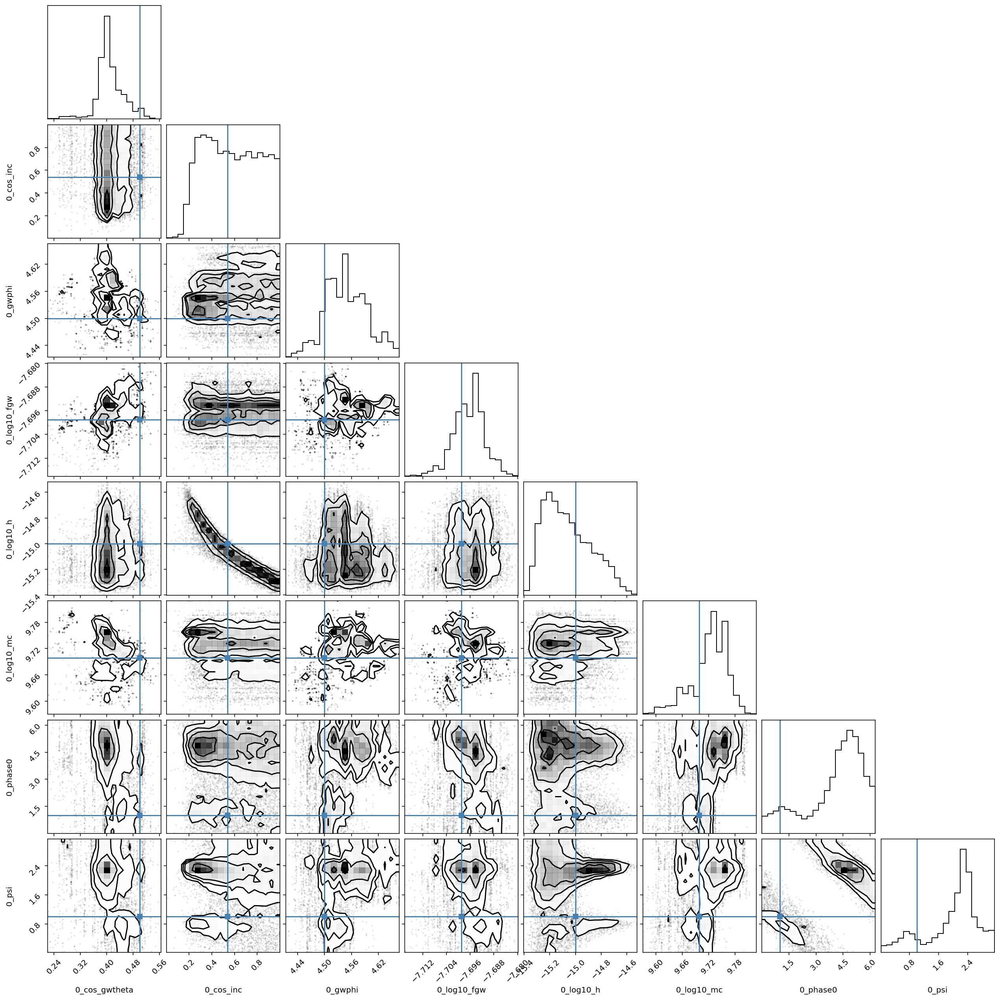

In [9]:
#common parameter corner

corner_mask = [0, 1, 2, 3, 4, 5, 6, 7]
labels = ["0_cos_gwtheta", "0_cos_inc", "0_gwphi", "0_log10_fgw",
          "0_log10_h", "0_log10_mc", "0_phase0", "0_psi"]
ranges = [0.999, ]*8
#ranges = [(-1,1), 0.99, (0,2*np.pi), (-8,-7), 0.99, (9,10), 0.99, 0.99, ]

#corner_mask = [8, 9, 10, 11, 12, 13]
#labels = ["B1855+09_cw0_p_dist", "B1855+09_cw0_p_phase",
#          "B1937+21_cw0_p_dist", "B1937+21_cw0_p_phase",
#          "B1953+29_cw0_p_dist", "B1953+29_cw0_p_phase"]
#ranges = [0.99, ]*6
#ranges = [(-3,3), (0, 2*np.pi)]*3


#corner_mask = [1, 4, 6, 7]
#labels = ["0_cos_inc", "0_log10_h", "0_phase0", "0_psi"]
#ranges = [0.999, 0.999, 0.999, 0.999]

truth = [xxx[key] for key in labels]
fig = corner.corner(samples_cold[10_000::10,corner_mask], labels=labels,
                    truths=truth, range=ranges, hist_kwargs={"density":True})

"""
Xs = np.linspace(0,2*np.pi)
Ys = np.linspace(-3.0,3.0)

print(len(fig.axes))
for i, ax in enumerate(fig.axes):
    if i%(len(labels)+1)==0:
        if i%(2*(len(labels)+1))==0:
            ax.plot(Ys, norm.pdf(Ys), color="xkcd:green")
        else:
            ax.plot(Xs, Xs*0+1/(2*np.pi), color="xkcd:green")
    #print(ax.set_xlabel(i))
"""

In [74]:
pta = BayesHopper.get_ptas(psrs, max_n_source=1, include_psr_term=True,
                                vary_white_noise=False, include_per_psr_rn=False, vary_per_psr_rn=False)[1][0][0]

In [77]:
print(pta.get_lnlikelihood(xxx))
print(pta.get_lnlikelihood(samples_cold[-1,:]))
print(4_939_550, 4_939_650)

4895365.04976054
4896763.704642486
4939550 4939650


In [13]:
with open('fast_like_test_psrs_A1e-15_M5e9_f2e-8_evolve_no_noise.pkl', 'rb') as psr_pkl:
    psrs_no_noise = pickle.load(psr_pkl)
    
print(len(psrs_no_noise))

parpath = './12p5yr_stochastic_analysis/data/par/'
parfiles = sorted(glob.glob(parpath + '*.par'))
parfiles = [pf for pf in parfiles if 'J1713+0747_NANOGrav_12yv3.gls.par' not in pf]
timfiles = sorted(glob.glob('./FakeTims/fake_*_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim'))

print(len(parfiles))
print(len(timfiles))

psrs_no_noise2 = []
for p, t in zip(parfiles, timfiles):
    print(p)
    print(t)
    psr = Pulsar(p, t, ephem='DE438', clk=None)
    psrs_no_noise2.append(psr)

45
45
45
./12p5yr_stochastic_analysis/data/par/B1855+09_NANOGrav_12yv3.gls.par
./FakeTims/fake_B1855+09_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/B1937+21_NANOGrav_12yv3.gls.par[tempo2Util.C:396] Warning: [MISC1] Unknown parameter in par file:  DMX
[tempo2Util.C:401] Warning: [DUP1] duplicated warnings have been suppressed.

[tempo2Util.C:396] Warning: [PAR2] Have not set a DM epoch. The period epoch will be used instead. ../12p5yr_stochastic_analysis/data/par/B1855+09_NANOGrav_12yv3.gls.par
[tempo2Util.C:396] Warning: [TIM1] Please place MODE flags in the parameter file 

./FakeTims/fake_B1937+21_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/B1953+29_NANOGrav_12yv3.gls.par

./FakeTims/fake_B1953+29_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J0023+0923_NANOGrav_12yv3.gls.par
./FakeTims/fake_J0023+0923_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J0030+0451_NANOGrav_12yv3.gls.par
./FakeTims/fake_J0030+0451_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J0340+4130_NANOGrav_12yv3.gls.par

./FakeTims/fake_J0340+4130_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J0613-0200_NANOGrav_12yv3.gls.par
./FakeTims/fake_J0613-0200_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J0636+5128_NANOGrav_12yv3.gls.par

./FakeTims/fake_J0636+5128_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J0645+5158_NANOGrav_12yv3.gls.par
./FakeTims/fake_J0645+5158_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J0740+6620_NANOGrav_12yv3.gls.par
./FakeTims/fake_J0740+6620_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J0931-1902_NANOGrav_12yv3.gls.par
./FakeTims/fake_J0931-1902_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1012+5307_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1012+5307_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1024-0719_NANOGrav_12yv3.gls.par

./FakeTims/fake_J1024-0719_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1125+7819_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1125+7819_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1453+1902_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1453+1902_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1455-3330_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1455-3330_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1600-3053_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1600-3053_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1614-2230_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1614-2230_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1640+2224_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1640+2224_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1643-1224_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1643-1224_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1713+0747_NANOGrav_12yv3.gls.t2.par

./FakeTims/fake_J1713+0747_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1738+0333_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1738+0333_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1741+1351_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1741+1351_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1744-1134_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1744-1134_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1747-4036_NANOGrav_12yv3.gls.par

./FakeTims/fake_J1747-4036_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1832-0836_NANOGrav_12yv3.gls.par

./FakeTims/fake_J1832-0836_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1853+1303_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1853+1303_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1903+0327_NANOGrav_12yv3.gls.par

./FakeTims/fake_J1903+0327_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1909-3744_NANOGrav_12yv3.gls.par

./FakeTims/fake_J1909-3744_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1910+1256_NANOGrav_12yv3.gls.par

./FakeTims/fake_J1910+1256_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1911+1347_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1911+1347_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1918-0642_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1918-0642_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J1923+2515_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1923+2515_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J1944+0907_NANOGrav_12yv3.gls.par
./FakeTims/fake_J1944+0907_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2010-1323_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2010-1323_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2017+0603_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2017+0603_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2033+1734_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2033+1734_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2043+1711_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2043+1711_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2145-0750_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2145-0750_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim
./12p5yr_stochastic_analysis/data/par/J2214+3000_NANOGrav_12yv3.gls.par

./FakeTims/fake_J2214+3000_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2229+2643_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2229+2643_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2234+0611_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2234+0611_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2234+0944_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2234+0944_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2302+4442_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2302+4442_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim


./12p5yr_stochastic_analysis/data/par/J2317+1439_NANOGrav_12yv3.gls.par
./FakeTims/fake_J2317+1439_fast_cw_test_A1e-15_M5e9_f2e-8_evolve_no_noise.tim



0
0


<timed exec>:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


1
1
CPU times: user 2.27 s, sys: 0 ns, total: 2.27 s
Wall time: 2.27 s


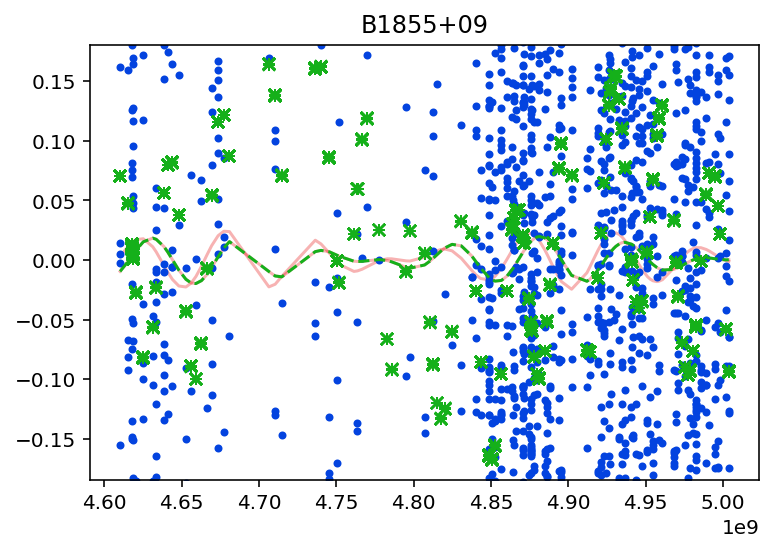

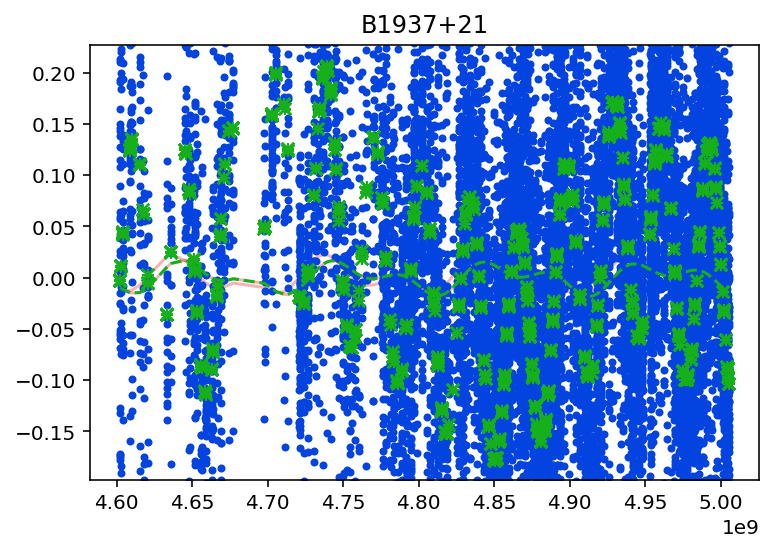

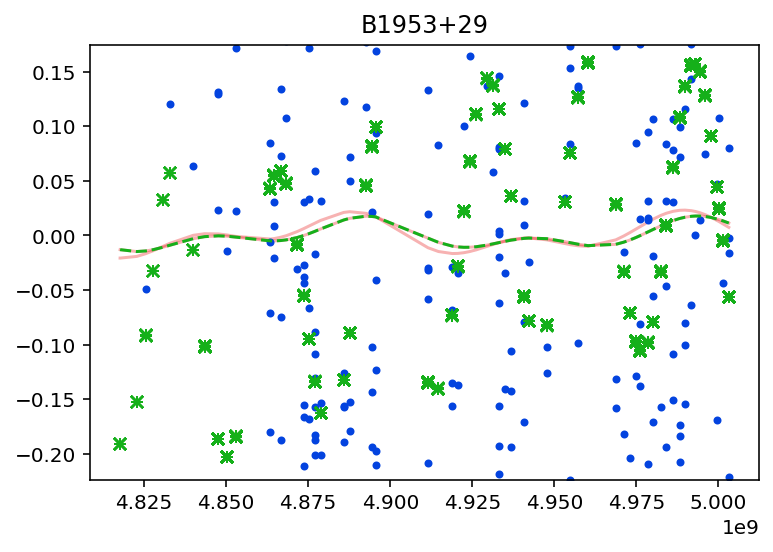

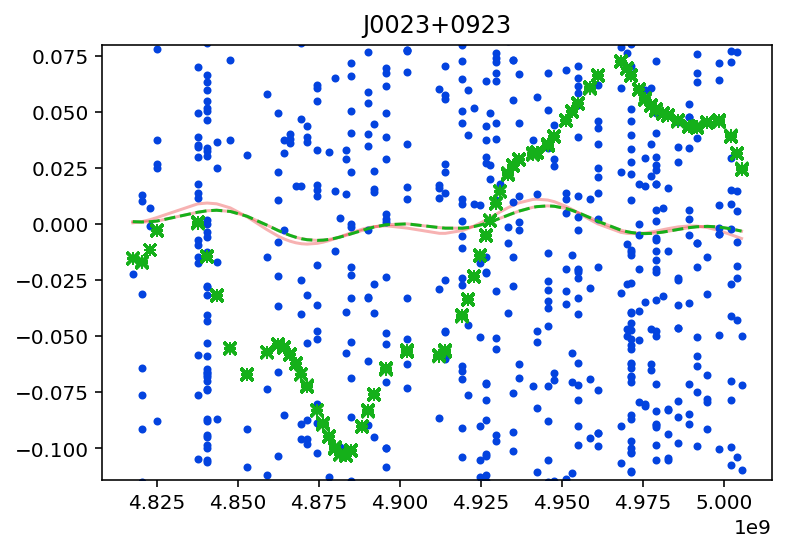

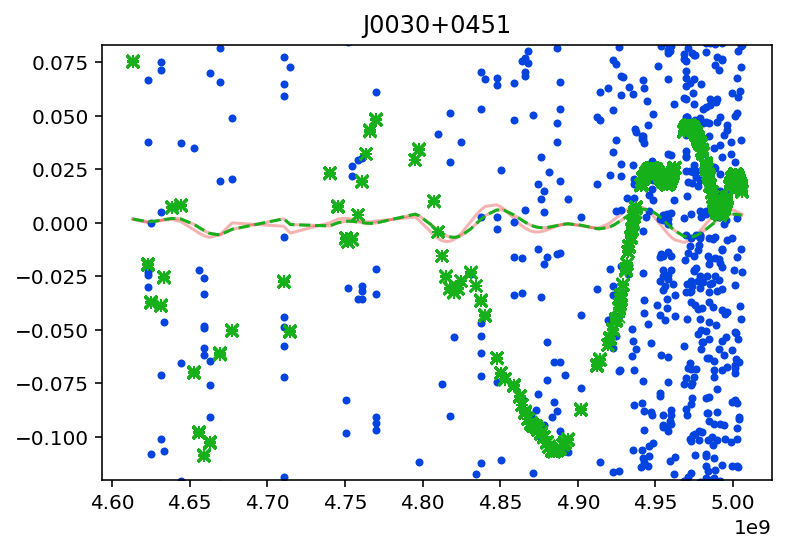

...

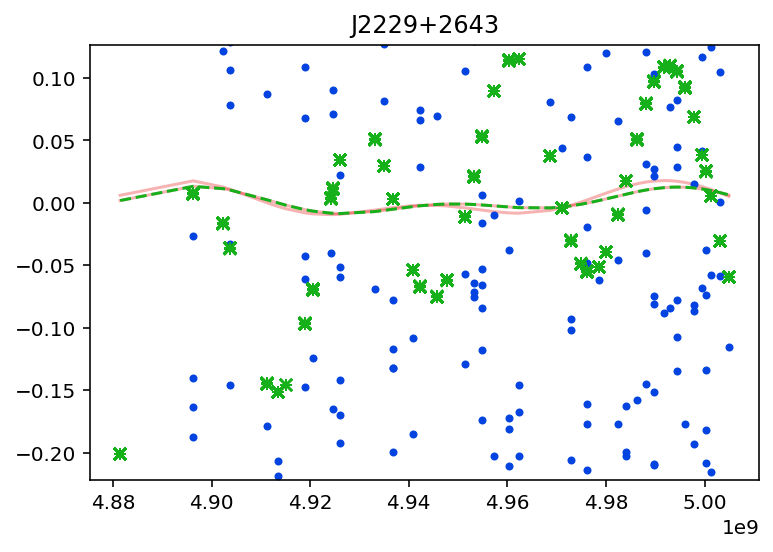

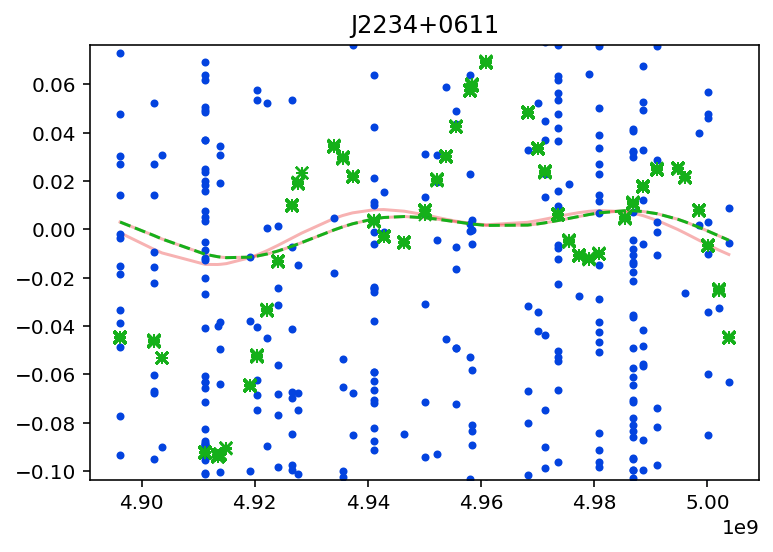

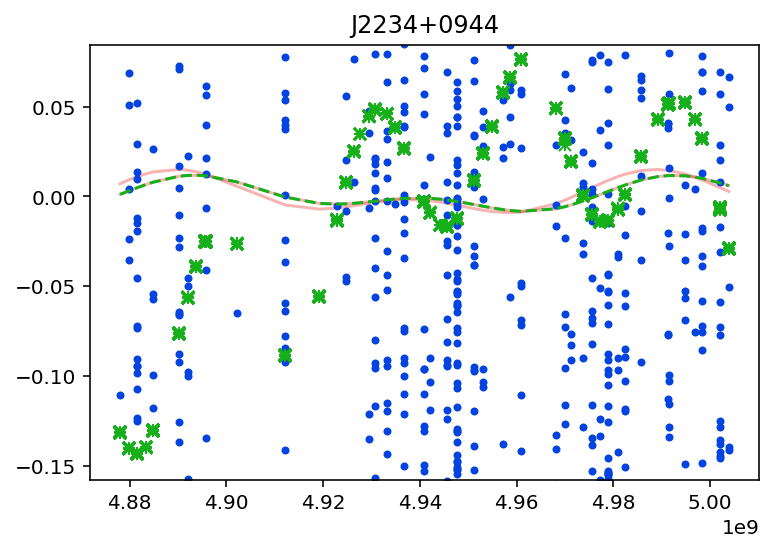

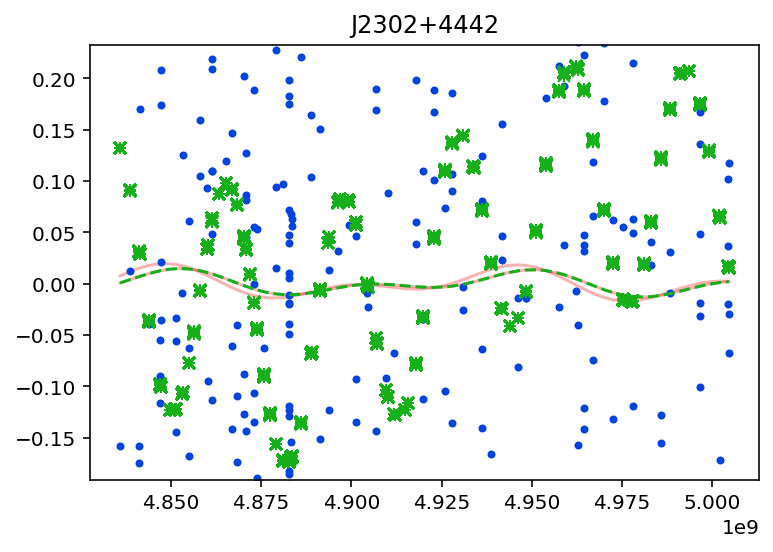

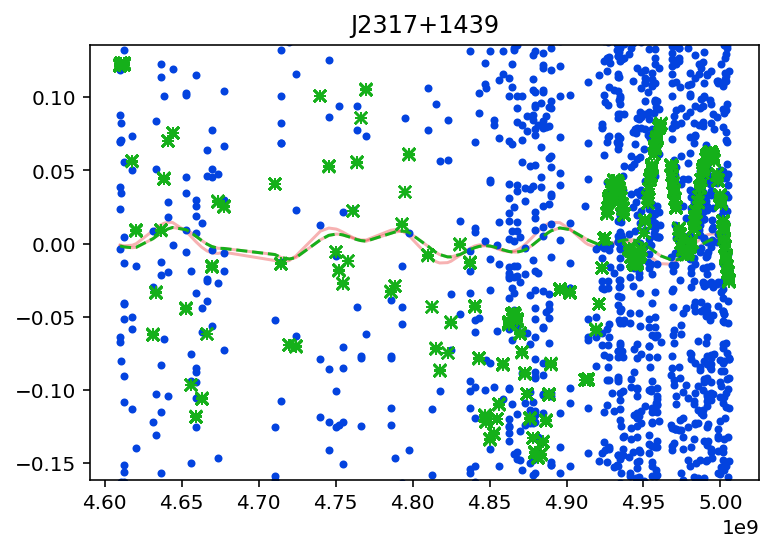

In [15]:
%%time
N = 2

burnin = 0#70_000

np.random.seed(1996)

for I in range(N):
    #print("-"*30)
    print(I)
    #iii = np.random.randint(samples_cold.shape[0]-burnin) + burnin
    iii = np.random.randint(2)
    print(iii)
    XXX = {}
    param_list =[]
    
    n_source = 1
    
    for nnn in range(n_source):
        XXX["0_cos_gwtheta"] = samples_cold[iii,list(par_names).index(str(nnn)+'_cos_gwtheta')]
        XXX["0_cos_inc"] = samples_cold[iii,list(par_names).index(str(nnn)+'_cos_inc')]
        XXX["0_gwphi"] = samples_cold[iii,list(par_names).index(str(nnn)+'_gwphi')]
        XXX["0_log10_fgw"] = samples_cold[iii,list(par_names).index(str(nnn)+'_log10_fgw')]
        XXX["0_log10_h"] = samples_cold[iii,list(par_names).index(str(nnn)+'_log10_h')]
        XXX["0_log10_mc"] = samples_cold[iii,list(par_names).index(str(nnn)+'_log10_mc')]
        XXX["0_phase0"] = samples_cold[iii,list(par_names).index(str(nnn)+'_phase0')]
        XXX["0_psi"] = samples_cold[iii,list(par_names).index(str(nnn)+'_psi')]

        for j in range(len(psrs)):
            XXX[psrs[j].name+"_cw0_p_dist"] = samples_cold[iii,
                                        list(par_names).index(psrs[j].name+'_cw0_p_dist')]
            XXX[psrs[j].name+"_cw0_p_phase"] = samples_cold[iii,
                                        list(par_names).index(psrs[j].name+'_cw0_p_phase')]


    #print(xxx)

    ptas = BayesHopper.get_ptas(psrs, max_n_source=n_source, include_psr_term=True,
                                vary_white_noise=True, include_per_psr_rn=False, vary_per_psr_rn=False)

    delay_all_psr = ptas[n_source][0][0].get_delay(XXX)
    delays_injected = ptas[n_source][0][0].get_delay(xxx)
    #delay_all_psr = ptas[1][0][0].get_delay(xxx)
    
    #print(ptas[1][0][0].summary())

    for i,psr in enumerate(psrs):
        plt.figure(i)
        plt.plot(psr.toas, delay_all_psr[i]*1e6, color='xkcd:red', alpha=0.3)
        if I==N-1:
            plt.plot(psr.toas, psr.residuals*1e6, ls='', marker='.', color='xkcd:blue')
            plt.plot(psrs_no_noise[i].toas, psrs_no_noise[i].residuals*1e6, ls='', marker='+', color='xkcd:green')
            plt.plot(psrs_no_noise2[i].toas, psrs_no_noise2[i].residuals*1e6, ls='', marker='x', color='xkcd:green')
            plt.plot(psr.toas, delays_injected[i]*1e6, ls='--', color='xkcd:green')
            #plt.ylim((np.min(delays_injected[i])*1e6*1.1 , np.max(delays_injected[i])*1e6*1.1))
            plt.ylim((np.min(psrs_no_noise[i].residuals)*1e6*1.1 , np.max(psrs_no_noise[i].residuals)*1e6*1.1))
            plt.title(psr.name)
        #print(delay_all_psr[i])

In [2]:
runtime = 20200 #s
N = 7_500_000
N_intrinsic = 7_500
n_chain = 8
print("Runtime = ", str(runtime/3600), " h")
print("Time per step in single chain = ", str(runtime/N/n_chain*1e6), " us")
print("Time per intrinsic step in single chain = ", str(runtime/N_intrinsic/n_chain), " s")

Runtime =  5.611111111111111  h
Time per step in single chain =  336.66666666666663  us
Time per intrinsic step in single chain =  0.33666666666666667  s


In [53]:
15000/3600

4.166666666666667

In [2]:
52501.89/3600/10

1.4583858333333333

In [23]:
from numba.typed import List

def LOL(x):
    #x[1] = 10
    x_new = List([])
    for i in range(len(x)):
        x_new.append(x[-i])
    x[:] = x_new
    print(x)

In [24]:
x = List([0,1,2,3])
print(x)
LOL(x)
print(x)

[0, 1, 2, 3, ...]
[0, 3, 2, 1, ...]
[0, 3, 2, 1, ...]


In [98]:
class HAHA:
    def __init__(self, puff):
        self.puff = puff

def LOL2(x):
    #x[1] = 10
    x[2].puff = 10
    print([y.puff for y in x])

In [99]:
x = [HAHA(k) for k in range(3)]
print([y.puff for y in x])

LOL2(x)
print([y.puff for y in x])

[0, 1, 2]
[0, 1, 10]
[0, 1, 10]


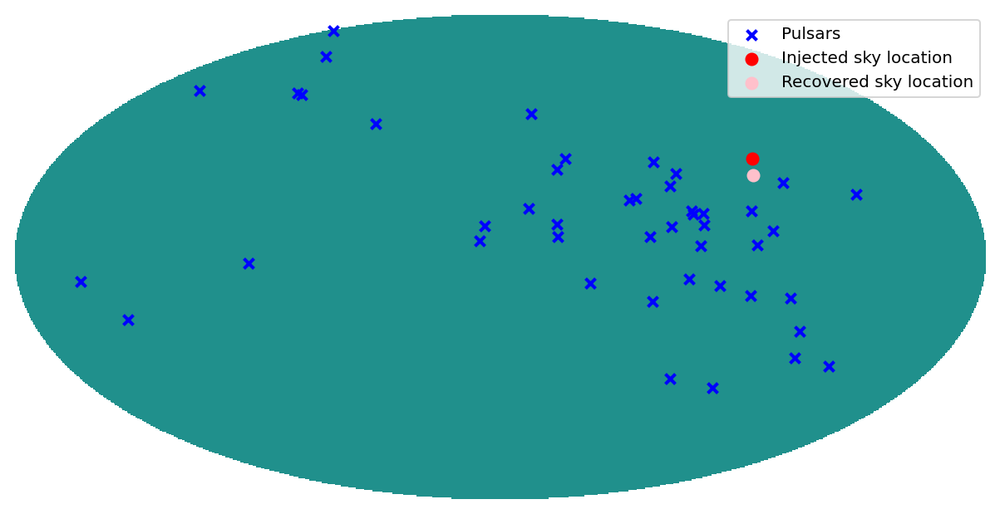

In [45]:
NSIDE=8
m = np.zeros(hp.nside2npix(NSIDE))
hp.mollview(m, title='', cbar=False)

hp.projscatter(psrs[0].theta, psrs[0].phi, marker='x', linewidth=2, label='Pulsars', color='blue')
for p in psrs[1:]:
    hp.projscatter(p.theta, p.phi, marker='x', linewidth=2, color='blue')

hp.projscatter(np.arccos(xxx['0_cos_gwtheta']), xxx['0_gwphi'],
               marker='o', linewidth=2, color='red', label='Injected sky location')

hp.projscatter(np.arccos(0.42), 4.55,
               marker='o', linewidth=2, color='pink', label='Recovered sky location')

plt.legend()


In [82]:
fish = np.array([float(x) for x in "4.21917820e-05  2.43727573e-03 -9.52236453e-04  8.74998013e-07\
  8.80639580e-04  1.03354966e-04  7.78779201e-03  1.48296640e-03\
 -2.34569486e-02 -2.38609294e+00 -7.42816897e-03 -2.76026176e-02\
 -2.40614414e-02  2.38609294e+00 -2.40345120e-02  3.30382100e+00\
 -2.38344467e-02 -4.29496730e+01 -2.39407319e-02  2.14748365e+01\
 -2.34954447e-02 -2.14748365e+00 -2.39407319e-02 -1.43165577e+01\
 -2.41833744e-02  1.65191050e+00 -2.39540842e-02  2.14748365e+01\
 -2.39273944e-02 -4.29496730e+01 -2.61251052e-02  2.77094664e-01\
 -2.38080227e-02 -6.13566757e+00 -2.38741929e-02 -6.13566757e+00\
 -2.39140718e-02 -7.15827883e+00 -2.37948327e-02 -1.65191050e+00\
 -2.32663450e-02 -1.86737709e+00 -2.38476807e-02 -2.14748365e+01\
 -2.40210699e-02  2.55652815e-01 -2.39808336e-02 -1.07374182e+01\
 -2.51314646e-02  1.17928811e-02 -2.37816572e-02 -1.43165577e+00\
 -2.38344467e-02 -5.30242876e-01 -2.40345120e-02  1.02996818e-01\
 -2.40479692e-02  2.38609294e+00 -2.40345120e-02  2.14748365e+00\
 -2.38874711e-02  1.43165577e+01 -2.39808336e-02  4.77218588e+00\
 -2.40479692e-02  2.85569634e-02 -2.35987214e-02 -7.27960559e-01\
 -2.43203131e-02  6.31612838e-01 -2.37553501e-02 -1.78956971e+00\
 -2.39808336e-02  2.86331153e+00 -2.41290298e-02  1.43165577e+00\
 -2.38874711e-02 -5.36870912e+00 -2.38874711e-02 -3.30382100e+00\
 -2.40345120e-02  4.29496730e+00 -2.43340923e-02  5.80400986e-01\
 -2.42928014e-02  9.76128931e-01 -2.40345120e-02  3.06783378e+00\
 -2.39942307e-02  1.07374182e+01 -2.41561715e-02  2.14748365e+00\
 -2.39674514e-02            -inf -2.38741929e-02 -4.29496730e+00\
 -2.37816572e-02 -1.43165577e+01".split(" ") if x != ''])

fish2 = np.array([float(x) for x in "4.21534388e-05  2.43806158e-03 -9.90903528e-04  8.80172874e-07\
  8.80662151e-04  1.02953382e-04  7.79227098e-03  1.48317637e-03\
 -7.96692134e-01 -2.40076428e+00 -1.07262629e-02 -2.75905600e-02\
 -4.36924445e+00  2.37816572e+00 -3.87282894e+00  3.03102844e+00\
 -1.64055283e+00 -3.25376310e+01 -2.62528563e+00  3.25376310e+01\
 -8.04903916e-01 -2.25576013e+00 -2.17687141e+00 -1.30546118e+01\
 -5.57787961e+01  1.60920468e+00 -2.67599208e+00  3.94033697e+01\
 -2.31909681e+00  1.53391689e+02  3.22929872e-01  2.77488519e-01\
 -1.59901984e+00 -5.37542841e+00 -1.93554182e+00 -5.47827461e+00\
 -2.08291333e+00 -6.80660427e+00 -1.45198353e+00 -1.66342653e+00\
 -6.13829826e-01 -1.83467206e+00 -1.74450337e+00 -2.58732970e+01\
 -3.94395528e+00  2.56262965e-01 -2.78893980e+00 -9.41878793e+00\
  6.45374500e-01  1.17936583e-02 -1.39130784e+00 -1.42784817e+00\
 -1.59308876e+00 -5.29785037e-01 -3.74778996e+00  1.02784839e-01\
 -4.21902485e+00  2.51020882e+00 -4.93107611e+00  2.15936013e+00\
 -1.82609154e+00  1.84333360e+01 -2.63656679e+00  5.31555358e+00\
 -5.20602096e+00  2.85763436e-02 -9.58484110e-01 -7.17262407e-01\
  4.30357444e+00  6.34037097e-01 -1.33757935e+00 -1.75807094e+00\
 -2.94579376e+00  3.17440303e+00 -1.09565492e+01  1.48102321e+00\
 -1.87226124e+00 -4.56425855e+00 -1.87471292e+00 -3.34238700e+00\
 -3.53204547e+00  4.60339474e+00  3.42774724e+00  5.80244163e-01\
  5.10091128e+00  9.82605192e-01 -3.38186401e+00  3.06783378e+00\
 -2.72869587e+00  8.78316420e+00 -2.33422136e+01  2.20707466e+00\
 -2.65613315e+00 -6.50752621e+01 -1.92599430e+00 -4.21075225e+00\
 -1.45296593e+00 -2.24867398e+01".split(" ") if x != ''])

fish3 = np.array([float(x) for x in "4.57975583e-05  2.43799537e-03 -9.59968797e-04  1.48627227e-06\
  8.79865053e-04  1.06909165e-04  7.79286593e-03  1.48366741e-03\
 -1.18864847e+00 -2.40320913e+00 -1.07718796e-02 -2.75829869e-02\
  5.41903844e+00  2.37765228e+00  6.45481191e+00  3.03077177e+00\
 -5.09861024e+00 -3.26886924e+01  3.01697618e+01  3.25919509e+01\
 -1.20639727e+00 -2.25699295e+00 -2.17005219e+01 -1.30316381e+01\
  2.53050015e+00  1.60952430e+00  2.48120583e+01  3.97020456e+01\
 -5.65276033e+01  1.49130809e+02  2.84910589e-01  2.77535139e-01\
 -4.72363739e+00 -5.36790393e+00 -9.71031018e+00 -5.47932295e+00\
 -1.49436947e+01 -6.80261542e+00 -3.63758325e+00 -1.66370360e+00\
 -8.23025595e-01 -1.83407663e+00 -6.27112384e+00 -2.59498961e+01\
  6.24195921e+00  2.56277492e-01  1.81413613e+01 -9.41177038e+00\
  5.09296335e-01  1.17977537e-02 -3.27557546e+00 -1.42802382e+00\
 -4.66261444e+00 -5.29883733e-01  6.83291805e+00  1.02793006e-01\
  5.66618377e+00  2.51197058e+00  4.73922196e+00  2.15915387e+00\
 -7.44335950e+00  1.85255663e+01  2.93974490e+01  5.31877908e+00\
  4.51332180e+00  2.85799642e-02 -1.58826388e+00 -7.17295948e-01\
  1.54829949e+00  6.34005275e-01 -2.98796962e+00 -1.75812851e+00\
  1.34697588e+01  3.17520093e+00  3.10552150e+00  1.48177942e+00\
 -8.27243841e+00 -4.56294931e+00 -8.32196725e+00 -3.34459938e+00\
  7.66082922e+00  4.60285207e+00  1.41723306e+00  5.80296689e-01\
  1.64059042e+00  9.82665892e-01  8.49630531e+00  3.06864478e+00\
  2.13149742e+01  8.77150474e+00  2.69779294e+00  2.20734690e+00\
  2.68939718e+01 -6.42766731e+01 -9.48032689e+00 -4.21170195e+00\
 -3.63779892e+00 -2.25256584e+01".split(" ") if x != ''])

print(sum([int(x) for x in fish>0.0]))
print(sum([int(x) for x in fish2>0.0]))
print(sum([int(x) for x in fish3>0.0]))

30
36
55


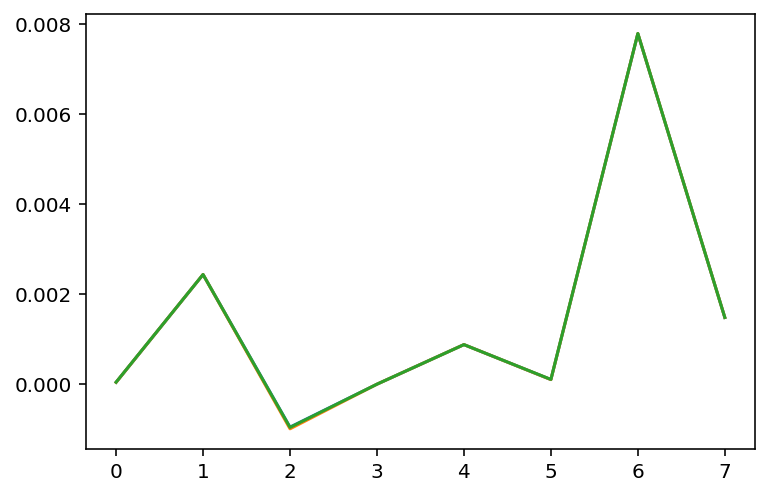

In [107]:
plt.plot(fish[:8])
plt.plot(fish2[:8])
plt.plot(fish3[:8])

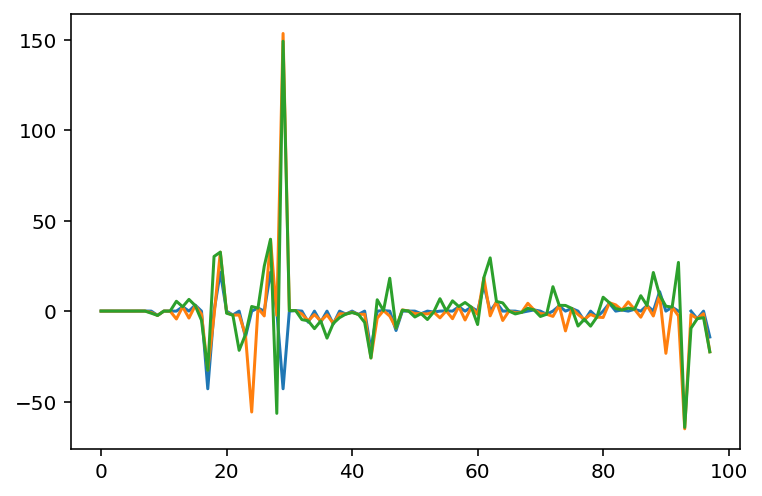

In [109]:
plt.plot(fish)
plt.plot(fish2)
plt.plot(fish3)
#plt.ylim(-0.1,0.1)

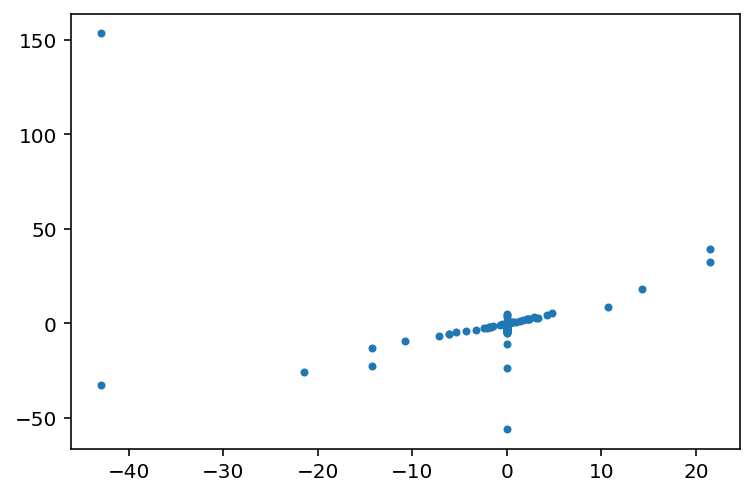

In [84]:
plt.plot(fish, fish2, ls='', marker='.')

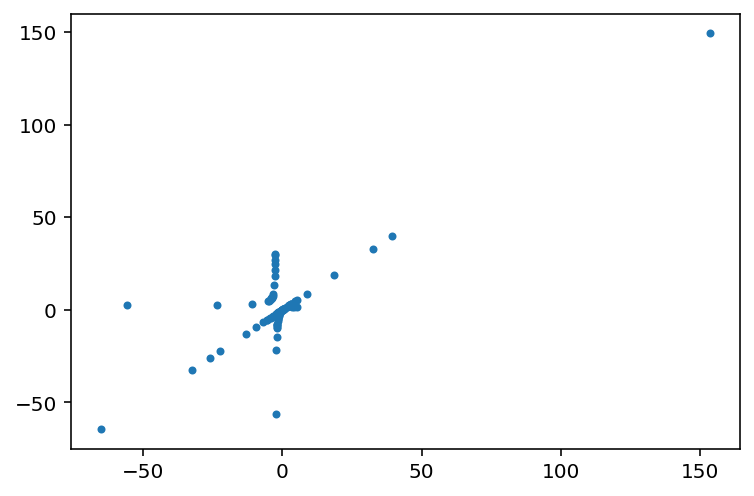

In [85]:
plt.plot(fish2, fish3, ls='', marker='.')

In [105]:
FISHER = np.where(np.isfinite(fish), fish, 1.0)
FISH = np.where(FISHER>0.0, FISHER, 1.0)

print(np.sqrt(FISH))

[6.49552015e-03 4.93687728e-02 1.00000000e+00 9.35413285e-04
 2.96755721e-02 1.01663644e-02 8.82484675e-02 3.85093028e-02
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.54469833e+00 1.00000000e+00 1.81764160e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 4.63409500e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.28526670e+00 1.00000000e+00 4.63409500e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 5.26397819e-01
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 5.05621217e-01 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.08595033e-01 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 3.20931173e-01
 1.00000000e+00 1.54469833e+00 1.00000000e+00 1.46542951e+00
 1.00000000e+00 3.78372273e+00 1.00000000e+00 2.18453333e+00
 1.00000000e+00 1.689880

[[3.08487866e+13 2.99307093e+13 3.08485239e+13 2.99308925e+13]
 [2.99307093e+13 7.72012627e+13 2.99301265e+13 7.72013771e+13]
 [3.08485239e+13 2.99301265e+13 3.08482612e+13 2.99303096e+13]
 [2.99308925e+13 7.72013771e+13 2.99303096e+13 7.72014916e+13]]
[[3.08487866e+13 2.99307093e+13 3.08485239e+13 2.99308925e+13]
 [2.99307093e+13 7.72012627e+13 2.99301265e+13 7.72013771e+13]
 [3.08485239e+13 2.99301265e+13 3.08482612e+13 2.99303096e+13]
 [2.99308925e+13 7.72013771e+13 2.99303096e+13 7.72014916e+13]]
(array([-3.21847900e+04,  7.93643268e+04,  3.23403997e+13,  1.83759402e+14]), array([[ 0.60477858,  0.36639039,  0.63487083, -0.31135187],
       [ 0.36639062, -0.60477868, -0.3113519 , -0.63487058],
       [-0.60477709, -0.36639545,  0.63487174, -0.31134695],
       [-0.36639522,  0.60477698, -0.31134691, -0.63487199]]))
(array([-3.21837869e+04,  7.93653398e+04,  3.23403997e+13,  1.83759402e+14]), array([[ 0.60477855,  0.36639043,  0.63487083, -0.31135187],
       [ 0.36639066, -0.6047786

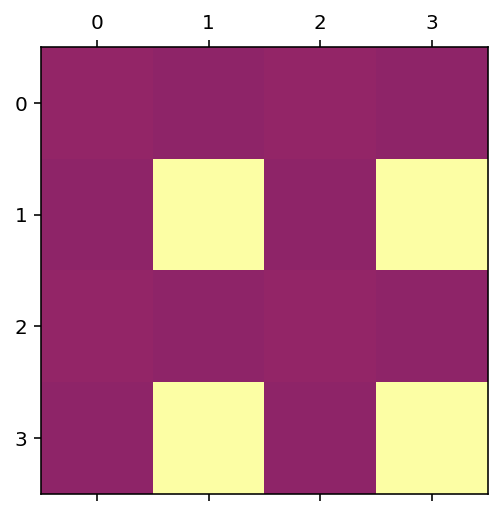

In [60]:
#MM = np.array([[1.77263093e+10, 6.80390678e+09, 1.76033051e+10, 6.91682673e+09],
# [6.80390678e+09, 2.79298435e+09, 6.75534140e+09, 2.83539847e+09],
# [1.76033051e+10, 6.75534140e+09, 1.74811646e+10, 6.86748472e+09],
# [6.91682673e+09, 2.83539847e+09, 6.86748472e+09, 2.87853666e+09]])

MM = np.array([[3.08487866e+13, 2.99307093e+13, 3.08485239e+13, 2.99308925e+13],
 [2.99307093e+13, 7.72012627e+13, 2.99301265e+13, 7.72013771e+13],
 [3.08485239e+13, 2.99301265e+13, 3.08482612e+13, 2.99303096e+13],
 [2.99308925e+13, 7.72013771e+13, 2.99303096e+13, 7.72014916e+13]])

MM_fix = MM + np.eye(4)

plt.matshow(MM, cmap="inferno", vmin=0)
print(MM)
print(MM_fix)
print(np.linalg.eigh(MM))
print(np.linalg.eigh(MM_fix))
test = np.array([0.60477858,0.36639062,-0.60477709,-0.36639522])
print(np.dot(np.dot(test,MM), test))

eig_val, eig_vec = np.linalg.eigh(MM)

eig_val_fix = np.where(eig_val>0.0, eig_val, 1.0)
print("Meh")
print(eig_val_fix)

MM_fix2 = np.dot(np.dot(eig_vec,np.diag(eig_val_fix)), eig_vec.T)
print(MM_fix2)
print((MM-MM_fix2)/MM)
print(np.linalg.eigh(MM_fix2))

In [4]:
#use PTA used in current CW search
tmin = [p.toas.min() for p in psrs]
tmax = [p.toas.max() for p in psrs]
Tspan = np.max(tmax) - np.min(tmin)

efac = parameter.Constant()
equad = parameter.Constant()
ecorr = parameter.Constant()

# define selection by observing backend
selection = selections.Selection(selections.by_backend)

# define white noise signals
ef = white_signals.MeasurementNoise(efac=efac, selection=selection)
eq = white_signals.EquadNoise(log10_equad=equad, selection=selection)
#ec = white_signals.EcorrKernelNoise(log10_ecorr=ecorr, selection=selection)
ec = gp_signals.EcorrBasisModel(log10_ecorr=ecorr, selection=selection)

log10_A = parameter.Uniform(-20, -11)
gamma = parameter.Uniform(0, 7)

# define powerlaw PSD and red noise signal
pl = utils.powerlaw(log10_A=log10_A, gamma=gamma)
rn = gp_signals.FourierBasisGP(pl, components=30)

cos_gwtheta = parameter.Uniform(-1,1)('0_cos_gwtheta')
gwphi = parameter.Uniform(0,2*np.pi)('0_gwphi')

#log_f = np.log10(freq)
#log10_fgw = parameter.Constant(log_f)('0_log10_fgw')
log10_fgw = parameter.Uniform(np.log10(3.5e-9), -7.0)('0_log10_fgw')

#if freq>=191.3e-9:
#    m = (1./(6**(3./2)*np.pi*freq*u.Hz))*(1./4)**(3./5)*(c.c**3/c.G)
#    m_max = np.log10(m.to(u.Msun).value)
#else:
m_max = 10

log10_mc = parameter.Uniform(7,m_max)('0_log10_mc')

phase0 = parameter.Uniform(0, 2*np.pi)('0_phase0')
psi = parameter.Uniform(0, np.pi)('0_psi')
cos_inc = parameter.Uniform(-1, 1)('0_cos_inc')

p_phase = parameter.Uniform(0, 2*np.pi)
p_dist = parameter.Normal(0, 1)

log10_h = parameter.Uniform(-18, -11)('0_log10_h')
#log10_h = parameter.LinearExp(-18, -11)('0_log10_h')

tref = 53000*86400

cw_wf = deterministic.cw_delay(cos_gwtheta=cos_gwtheta, gwphi=gwphi, log10_mc=log10_mc,
                               log10_h=log10_h, log10_fgw=log10_fgw, phase0=phase0, psrTerm=True,
                               p_phase=p_phase, p_dist=p_dist, evolve=True,
                               psi=psi, cos_inc=cos_inc, tref=53000*86400)
cw = deterministic.CWSignal(cw_wf, psrTerm=True, name='cw0')

log10_Agw = parameter.Constant(-16.27)('gwb_log10_A')
gamma_gw = parameter.Constant(6.6)('gwb_gamma')
cpl = utils.powerlaw(log10_A=log10_Agw, gamma=gamma_gw)
crn = gp_signals.FourierBasisGP(cpl, components=5, Tspan=Tspan,
                                        name='gw')

tm = gp_signals.TimingModel()

#s = ef + eq + ec + rn + crn + cw + tm
#s = ef + eq + ec + rn + cw + tm
#s = ef + eq + ec + cw + tm
s = ef + cw + tm

models = [s(psr) for psr in psrs]

pta = signal_base.PTA(models)

with open('QuickCW/data/channelized_12p5yr_v3_full_noisedict_gp_ecorr.json', 'r') as fp:
    noisedict = json.load(fp)

#print(noisedict)
pta.set_default_params(noisedict)
    

In [26]:
from QuickCW import CWFastLikelihoodNumba

p_dists = np.array([float(x) for x in "-0.76337936  0.08351978  0.12079594  1.12007059  0.14297955  1.14470228\
 -0.27893913  0.63389243 -0.44181676 -1.06898076 -0.79043493 -0.59468333\
 -0.7385562   1.00191215  0.61697951 -0.36525869 -0.34669137  0.03257918\
 -0.11408662  1.14719559  1.75964091 -0.65023079  0.42167061 -0.36651126\
 -0.07338997  0.45623063 -0.03929074 -0.35737678 -0.28939393 -0.14097819\
 -0.1062183   0.41777055  0.28988829 -0.19172159 -0.80517275 -0.25695741\
  0.7951195   0.32852497 -0.81485648 -0.28203861 -0.1739366   0.7208239\
 -0.3179772  -0.26338156  1.01976279".split(" ") if x != ''])

x0 = CWFastLikelihoodNumba.CWInfo(len(psrs), np.zeros(len(psrs)), p_dists,
                                  1.2248904935307785,
                                  0.0,
                                  4.5,
                                  -7.695689902190194,
                                  -15,
                                  9.694735640817898,
                                  0.0,
                                  0.0)

par_names = pta.param_names

samples_0 = np.array([par.sample() for par in pta.params])

samples_0[par_names.index("0_cos_gwtheta")] = 1.2248904935307785


FastL = CWFastLikelihoodNumba.CWFastLikelihood(psrs, pta, {pname:x for pname,x in zip(par_names,samples_0)}, x0)

/home/beno/anaconda3/envs/Holodeck/lib/python3.9/site-packages/enterprise_extensions/deterministic.py:295: RuntimeWarning: invalid value encountered in arccos
  gwtheta = np.arccos(cos_gwtheta)


In [27]:
print(FastL.MMs)

[[[ 2.45994602e+15  3.58400452e+14             nan             nan]
  [ 3.58400452e+14  3.41386435e+15             nan             nan]
  [            nan             nan             nan             nan]
  [            nan             nan             nan             nan]]

 [[ 5.41502594e+17 -3.13590676e+16             nan             nan]
  [-3.13590676e+16  4.79398380e+17             nan             nan]
  [            nan             nan             nan             nan]
  [            nan             nan             nan             nan]]

 [[ 8.35866174e+13 -1.21472077e+12             nan             nan]
  [-1.21472077e+12  5.96874138e+13             nan             nan]
  [            nan             nan             nan             nan]
  [            nan             nan             nan             nan]]

 [[ 4.41523640e+14 -9.73076114e+13             nan             nan]
  [-9.73076114e+13  6.36049001e+14             nan             nan]
  [            nan             nan        

In [40]:
acc_rate = FastL.get_lnlikelihood(x0)
print(acc_rate)
acc_rate += -np.inf
print(acc_rate)
if np.isnan(acc_rate):
    print("jeez")
if 0.5<=acc_rate:
    print("accepted")
else:
    print("rejected")

nan
nan
jeez
rejected


In [68]:
from QuickCW import CWFastLikelihoodNumba

p_dists = np.array([float(x) for x in "0.43973386  0.36244986  0.91775161  0.48849094 -0.01564284  0.31193806\
  0.5580536   0.05244329 -0.22293372 -1.50142928  0.4766205  -1.60614577\
 -2.4980768   1.56817188  1.50376866 -1.27678391 -0.15017815  0.46757009\
 -1.18287    -0.08523904 -1.04493493  1.37643007 -1.46672664  0.10544763\
 -0.06369187  0.3047987  -0.09823376 -0.10829697 -0.36291727  0.67412713\
  1.20846654 -0.81655037  2.97489084 -0.66215263 -0.39521006 -3.44925281\
  0.16555291 -0.36128335 -0.0680409   1.40763144  0.54144155 -2.30533402\
 -0.57808757  0.0123685  -1.40309857".split(" ") if x != ''])

x0 = CWFastLikelihoodNumba.CWInfo(len(psrs), np.zeros(len(psrs)), p_dists,
                                  -0.0858138818206555,
                                  0.0,
                                  4.998689860546229,
                                  -8.69098184324433,
                                  -15,
                                  7.424449790478429,
                                  0.0,
                                  0.0)

par_names = pta.param_names

samples_0 = np.array([par.sample() for par in pta.params])

samples_0[par_names.index("0_cos_gwtheta")] = -0.08581388182065558


FastL = CWFastLikelihoodNumba.CWFastLikelihood(psrs, pta, {pname:x for pname,x in zip(par_names,samples_0)}, x0)

------------------------------
[[2.87492795e+14 2.64718025e+13 2.87492779e+14 2.64718221e+13]
 [2.64718025e+13 4.42835519e+13 2.64717990e+13 4.42835456e+13]
 [2.87492779e+14 2.64717990e+13 2.87492763e+14 2.64718186e+13]
 [2.64718221e+13 4.42835456e+13 2.64718186e+13 4.42835393e+13]]
[1.58073634e+01 4.92668553e+01 8.28712057e+13 5.80681443e+14] [[-0.48467578 -0.5148683   0.07563688 -0.70304985]
 [-0.51486827  0.48467574 -0.7030499  -0.07563688]
 [ 0.48467576  0.51486836  0.07563691 -0.70304981]
 [ 0.51486839 -0.48467581 -0.70304976 -0.07563692]]
------------------------------
[[ 4.97875755e+16 -1.82550460e+15  4.97875103e+16 -1.82540461e+15]
 [-1.82550460e+15  6.50709194e+15 -1.82551478e+15  6.50707600e+15]
 [ 4.97875103e+16 -1.82551478e+15  4.97874451e+16 -1.82541478e+15]
 [-1.82540461e+15  6.50707600e+15 -1.82541478e+15  6.50706006e+15]]
[5.55308818e+03 8.84591182e+03 1.28604384e+16 9.97287343e+16] [[ 0.38926607 -0.59031452  0.02974547 -0.70648135]
 [ 0.59031437  0.38926597  0.7064815

------------------------------
[[ 6.22830432e+12 -5.19474429e+12  6.22830409e+12 -5.19473272e+12]
 [-5.19474429e+12  5.33887862e+12 -5.19474548e+12  5.33886809e+12]
 [ 6.22830409e+12 -5.19474548e+12  6.22830386e+12 -5.19473391e+12]
 [-5.19473272e+12  5.33886809e+12 -5.19473391e+12  5.33885756e+12]]
[1.14498020e+01 1.82272305e+01 1.13969148e+12 2.19946529e+13] [[-0.29340956 -0.64335857  0.47820109 -0.520888  ]
 [ 0.64335869 -0.29340953  0.52088798  0.47820096]
 [ 0.29341063  0.64335899  0.47819982 -0.52088804]
 [-0.64335886  0.29341066  0.52088806  0.47819995]]
------------------------------
[[ 7.55366900e+14 -9.38824160e+13  7.55366598e+14 -9.38816916e+13]
 [-9.38824160e+13  1.09850362e+14 -9.38824770e+13  1.09850212e+14]
 [ 7.55366598e+14 -9.38824770e+13  7.55366296e+14 -9.38817525e+13]
 [-9.38816916e+13  1.09850212e+14 -9.38817525e+13  1.09850062e+14]]
[6.19065050e+01 1.35765370e+02 1.92946933e+14 1.53748669e+15] [[-0.70516047  0.05242566  0.09974475 -0.7000366 ]
 [-0.05242562 -0.705

In [69]:
print(FastL.get_lnlikelihood(x0))
for MM in FastL.MMs:
    eigv_val, eigv_vec = np.linalg.eigh(MM)
    if np.min(eigv_val)<10.0:
        print(eigv_val)
print("-"*30)
for i in range(len(FastL.MMs)):
    FastL.MMs[i][0,0] += 1.0
    FastL.MMs[i][1,1] += 1.0
    FastL.MMs[i][2,2] += 1.0
    FastL.MMs[i][3,3] += 1.0
print(FastL.get_lnlikelihood(x0))
for MM in FastL.MMs:
    eigv_val, eigv_vec = np.linalg.eigh(MM)
    if np.min(eigv_val)<10.0:
        print(eigv_val)

4940338.163200364
[4.85550866e-01 1.14574852e+00 5.17843954e+09 2.86103102e+11]
[9.31088656e+00 3.28609884e+01 2.66508518e+13 2.06754462e+14]
[4.37287601e-01 9.86138357e-01 3.88728584e+09 1.97384825e+11]
[2.52521080e+00 1.38221581e+01 2.51661050e+08 3.23287644e+10]
[7.49215219e+00 2.73742714e+01 8.87016832e+10 6.58543660e+12]
[3.38583886e-01 2.98032819e+00 6.97025776e+08 5.09650280e+10]
[2.79468895e-01 9.84535185e-01 4.99910532e+08 3.23073944e+10]
[4.32854544e+00 6.30970401e+00 5.57123311e+09 2.48830612e+11]
[7.55449318e-01 1.00000033e+00 5.29476419e+07 1.08133379e+10]
[2.73273068e-02 8.46832338e-02 2.34804715e+07 1.65936042e+09]
[4.29219876e-01 2.79862436e+00 1.28035132e+12 1.33627629e+13]
[5.58171136e+00 1.45066675e+01 8.92669690e+12 1.19953176e+14]
[6.26877756e+00 1.45706790e+01 1.05144115e+11 3.12445852e+12]
[6.42280341e-01 1.52588267e+00 5.15926803e+09 3.06165825e+11]
[1.82631916e+00 7.08938885e+00 3.67041815e+09 2.75336806e+11]
[1.06069843e+00 9.20111228e+00 2.84139641e+10 1.2090

In [38]:
AA = [[3.0,2.9,3.0,2.9],
      [2.9,8.0,2.9,8.0],
      [3.0,2.9,3.0,2.9],
      [2.9,8.0,2.9,8.0]]

eigv_val, eigv_vec = np.linalg.eigh(AA)
print(eigv_val)
print(eigv_vec)
test2 = np.array([-0.60150096, 0.37174803, -0.60150096, 0.37174803])
print(np.dot(AA, test2))
print(np.dot(test2,np.dot(AA, test2)))
print(np.dot(np.dot(test2,AA), test2))

[-1.89943794e-15 -7.09586167e-16  3.34232411e+00  1.86576759e+01]
[[ 0.66953626  0.22742293  0.6428335  -0.29455915]
 [-0.22742293  0.66953626 -0.29455915 -0.6428335 ]
 [-0.66953626 -0.22742293  0.6428335  -0.29455915]
 [ 0.22742293 -0.66953626 -0.29455915 -0.6428335 ]]
[-1.45286719  2.45926291 -1.45286719  2.45926291]
3.576254299839124
3.576254299839124
